In [1]:
%load_ext autoreload
%autoreload 2

## Basic setup

In [2]:
import concord as ccd
import scanpy as sc
import torch
import warnings
from pathlib import Path
warnings.filterwarnings('ignore')
import time
from pathlib import Path
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
import matplotlib as mpl
custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}
mpl.rcParams['svg.fonttype'] = 'none'
mpl.rcParams['pdf.fonttype'] = 42

In [3]:
import time
from pathlib import Path
proj_name = "huycke_intestine"
file_name = proj_name
file_suffix = time.strftime('%b%d-%H%M')
seed = 0

save_dir = Path(f"../save/{proj_name}")
save_dir.mkdir(parents=True, exist_ok=True)

data_dir = Path(f"../data/{proj_name}")
data_dir.mkdir(parents=True, exist_ok=True)



### Visualization

In [4]:
adata = sc.read_h5ad(data_dir / f"adata_final_Jul17-1902.h5ad")

In [5]:
methods = [
  'scanorama',
  'liger',
  'harmony',
  'scvi',
  'seurat_cca',
  'seurat_rpca',
 'concord_hcl',
 'concord_knn'
]

In [6]:
# Define color palette for broad_cell_type_qz
adata.obs['stage'] = adata.obs['MouseAge_combined']
_, _, celltype_pal = ccd.pl.get_color_mapping(adata, 'cell_type', pal='Paired', seed=seed)
_, _, broad_celltype_pal = ccd.pl.get_color_mapping(adata, 'broad_cell_type', pal='tab20', seed=seed)
broad_celltype_pal['Doublet-like'] = '#757575'
_, _, mes_pal = ccd.pl.get_color_mapping(adata, 'mes_subtype', pal='Paired', seed=seed)
_, _, epi_pal = ccd.pl.get_color_mapping(adata, 'epi_subtype', pal='Paired', seed=seed)
_, _, batch_pal = ccd.pl.get_color_mapping(adata,'batch', pal='Set1', seed=seed)
_, _, phase_pal = ccd.pl.get_color_mapping(adata, 'phase', pal='Set1', seed=seed)
_, _, seg_pal = ccd.pl.get_color_mapping(adata, 'seg_classify', pal='tab10', seed=seed)
_, _, lane_pal = ccd.pl.get_color_mapping(adata,'LaneID', pal='Paired', seed=7)
stage_pal = {
    '12.5':"midnightblue", 
    '13.5':"dodgerblue", 
    '14.5':"seagreen", 
    '15.5':"#00C000", 
    '16.5':"#EEC900", 
    '17.5':"#FF7F00", 
    '18.5':"#FF0000"
}
pal = {"cell_type": celltype_pal,
    "broad_cell_type": broad_celltype_pal,
    "mes_subtype": mes_pal,
    "epi_subtype": epi_pal,
    "batch": batch_pal,
    'phase': phase_pal,
    'stage': stage_pal,
    'seg_classify': seg_pal,
    'LaneID': lane_pal}

In [23]:
basis = 'concord_hcl'
basis = 'concord_knn'
#basis = 'seurat_cca'
#basis = 'scvi'
basis = 'contrastive'
show_basis = basis + '_UMAP'
show_cols = ['batch', 'broad_cell_type', 'cell_type', 'mes_subtype', 'epi_subtype', 'phase', 'seg_classify', 'LaneID', 'stage']
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(13,12), dpi=600, ncols=3, font_size=6, point_size=1, legend_loc="on data",
    pal=pal,
    save_path=save_dir / f"{show_basis}_{file_suffix}.pdf"
)

In [ ]:
show_cols = ['batch', 'broad_cell_type', 'cell_type', 'mes_subtype', 'phase', 'seg_classify', 'LaneID', 'stage']
for col in show_cols:
    show_basis = f'{basis}_UMAP_3D'
    ccd.pl.plot_embedding_3d(
            adata, basis=show_basis, color_by=col,
            pal = pal, 
            save_path=save_dir / f'{show_basis}_{col}_{file_suffix}.html',
            point_size=1, opacity=0.8, width=1300, height=1000, 
            autosize=True,
            static=False
        )

concord.plotting.pl_embedding - INFO - Plotting 3D: concord_knn, color by phase, basis: UMAP_3D
palette_dict {'G1': '#4daf4a', 'G2M': '#377eb8', 'S': '#e41a1c'}
color_by phase
pal {'cell_type': {'ENS': '#4993c3', 'Endothelial': '#f88a89', 'Endothelial (Lymphatic)': '#f06c46', 'Epithelial (Goblet/EEC)': '#fdb35a', 'Epithelial (SC/TA/EC)': '#70449e', 'Epithelial (Spp1+Mia+)': '#53b043', 'Erythrocyte': '#569fa4', 'Lymphocyte (T/B/NK)': '#c7b699', 'MSC (Cycling)': '#ff870e', 'MSC (Ebf1+,CD166+)': '#e83233', 'MSC (Ebf1-/lo,CD166+)': '#b15928', 'Mesenchymal (Cycling PDGFRa hi/lo)': '#e19c78', 'Mesenchymal (PDGFRa-high)': '#aadb84', 'Mesenchymal (PDGFRa-low)': '#a6cee3', 'Mesothelial': '#8a9d5c', 'Myeloid (Macrophage/DC)': '#e7cb76', 'Smooth muscle cells': '#b295c7'}, 'broad_cell_type': {'Doublet-like': '#757575', 'ENS': '#c5b0d5', 'Endothelial': '#ff7f0e', 'Epithelial': '#8c564b', 'Erythrocyte': '#d62728', 'Lymphoid': '#aec7e8', 'MSC': '#ff9896', 'Mesenchymal (Pdgfra)': '#9467bd', 'Mesotheli

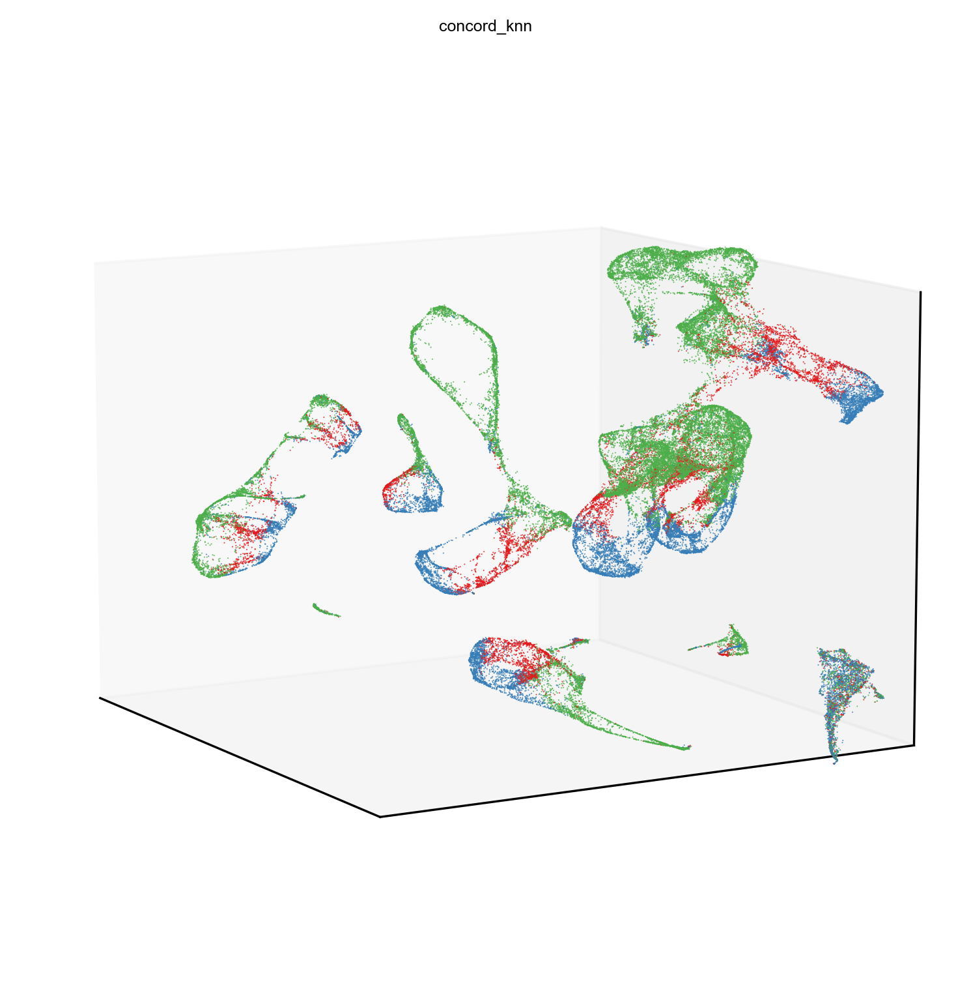

concord.plotting.pl_embedding - INFO - Saved multi-panel 3D figure: ../save/huycke_intestine/all_latent_3D_phase_UMAP_3D_Sep11-1616concord_knn_azim330_elev10.pdf


In [11]:
import matplotlib.pyplot as plt
concord_keys = ['concord_knn']
azims = [330] # KNN view
elevs = [10] # KNN view
show_cols = ['phase']
for azim in azims:
    for elev in elevs:
        with plt.rc_context(rc=custom_rc):
            ccd.pl.plot_all_embeddings_3d(
                adata=adata,
                combined_keys=concord_keys,         # or however you name your embeddings
                color_bys=show_cols,  # columns or gene names to color by
                basis_types=['UMAP_3D'],              # or whatever naming convention is in adata.obsm
                pal=pal,    
                ncols=2,
                rasterized=True,                   # Points get rasterized
                point_size=1,
                alpha=0.8,
                elev=elev,
                azim=azim,
                zoom_factor=0.05,
                show_grid=True,
                show_axis_labels=False,            # Turn off axis labels
                show_ticks=False,                  # No ticks
                show_legend=False,
                tick_label_font_size=6,
                legend_font_size=6,
                save_dir=save_dir,
                file_suffix=file_suffix + f'{concord_keys[0]}'+ f'_azim{azim}_elev{elev}',
                save_format='pdf',
            )

In [25]:
col = 'phase'
#col = 'broad_cell_type'
#basis = 'concord_knn'
col = 'stage'
basis = 'scvi'
show_basis = f'{basis}_UMAP_3D'
ccd.pl.plot_rotating_embedding_3d_to_mp4(adata, embedding_key=show_basis, color_by=col, save_path=save_dir / f'{show_basis}_{col}_{file_suffix}.mp4', 
                                         pal=pal,
                                      point_size=1, opacity=0.7, 
                                      width=1200, height=1000, dpi=300,
                                      elev=10, azim=330,
                                      rotation_duration=10, num_steps=300,
                                      legend_itemsize=100, font_size=16, seed=42)

number of frames: 300
MoviePy - Building video ../save/huycke_intestine/scvi_UMAP_3D_stage_Sep11-1616.mp4.
MoviePy - Writing video ../save/huycke_intestine/scvi_UMAP_3D_stage_Sep11-1616.mp4



MoviePy - Done !
MoviePy - video ready ../save/huycke_intestine/scvi_UMAP_3D_stage_Sep11-1616.mp4
Rotation video saved to ../save/huycke_intestine/scvi_UMAP_3D_stage_Sep11-1616.mp4


In [24]:
col = 'phase'
#col = 'broad_cell_type'
col = 'stage'
basis = 'concord_knn'
#basis = 'scvi'
show_basis = f'{basis}_UMAP_3D'
ccd.pl.plot_rotating_embedding_3d_to_mp4(adata, embedding_key=show_basis, color_by=col, save_path=save_dir / f'{show_basis}_{col}_{file_suffix}.mp4', 
                                         pal=pal,
                                      point_size=1, opacity=0.7, 
                                      width=1200, height=1000, dpi=300,
                                      elev=10, azim=330,
                                      rotation_duration=10, num_steps=300,
                                      legend_itemsize=100, font_size=16, seed=42)

number of frames: 300
MoviePy - Building video ../save/huycke_intestine/concord_knn_UMAP_3D_stage_Sep11-1616.mp4.
MoviePy - Writing video ../save/huycke_intestine/concord_knn_UMAP_3D_stage_Sep11-1616.mp4



MoviePy - Done !
MoviePy - video ready ../save/huycke_intestine/concord_knn_UMAP_3D_stage_Sep11-1616.mp4
Rotation video saved to ../save/huycke_intestine/concord_knn_UMAP_3D_stage_Sep11-1616.mp4


In [9]:
col = 'phase'
show_basis = f'Concord_UMAP_3D'
fig = ccd.pl.plot_embedding_3d(
        adata, basis=show_basis, color_by=col,
        pal=pal,
        save_path=save_dir / f'{show_basis}_{file_suffix}.html',
        point_size=1, opacity=0.8, width=1500, height=1000
    )

concord.plotting.pl_embedding - INFO - 3D plot saved to ../save/huycke_intestine/Concord_UMAP_3D_Sep17-1423_phase.html
